# Multimodal Modeling Explorations

In [1]:
import csv, os, sys, re, string, json, glob, shutil, random, datetime, math

import cv2
import pandas as pd
import numpy as np

from IPython.display import HTML as html_print
from IPython.display import Markdown
from IPython.display import clear_output

# from IPython.display import Image
from PIL import Image, ImageDraw, ImageFont
from ipywidgets import Video

import torch
from transformers import AutoTokenizer
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
sns.set()
from matplotlib import pyplot as plt
import matplotlib.patches as patches
%pylab inline

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
sys.path.insert(0, "../all_visualizations")
sys.path.insert(0, "../data_processing")

from visualization_utils import *
from sequencing_utils import show_one_sampled_data as show_one_sampled_data_wikihow
from sequencing_data_processors import WikiHowGeneralProcessor

## Declare Multimodal Modelings

In [3]:
from lavis.models import model_zoo
from lavis.models import load_model_and_preprocess

print(model_zoo)

Architectures                  Types
albef_classification           ve
albef_feature_extractor        base
albef_nlvr                     nlvr
albef_pretrain                 base
albef_retrieval                coco, flickr
albef_vqa                      vqav2
alpro_qa                       msrvtt, msvd
alpro_retrieval                msrvtt, didemo
blip_caption                   base_coco, large_coco
blip_classification            base
blip_feature_extractor         base
blip_image_text_matching       base, large
blip_nlvr                      nlvr
blip_pretrain                  base
blip_retrieval                 coco, flickr
blip_vqa                       vqav2, okvqa, aokvqa
blip2_opt                      pretrain_opt2.7b, pretrain_opt6.7b, caption_coco_opt2.7b, caption_coco_opt6.7b
blip2_t5                       pretrain_flant5xl, pretrain_flant5xl_vitL, pretrain_flant5xxl, caption_coco_flant5xl
blip2_feature_extractor        pretrain, pretrain_vitL, coco
blip2                      

### Captioning Model

In [4]:
# CPU device for the try-outs.
device = torch.device("cpu")

model, vis_processors, _ = load_model_and_preprocess(
    name="blip_caption",
    model_type="base_coco",
    is_eval=True,
    device=device
)

## Ego4D Datasets

In [5]:
# Use annotations to filter out the videos list we want.
annots_root = "/local1/hu528/ego4d_data_old/v1/annotations/"
curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"
curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"

all_narrations_file = os.path.join(annots_root, "narration.json")
all_narrations = json.load(open(all_narrations_file))

In [6]:
scod_train_file = "fho_scod_train.json"
scod_train_file = os.path.join(annots_root, scod_train_file)

scod_val_file = "fho_scod_val.json"
scod_val_file = os.path.join(annots_root, scod_val_file)

scod_train_data = json.load(open(scod_train_file))
scod_val_data = json.load(open(scod_val_file))

scod_clips = scod_train_data["clips"] + scod_val_data["clips"]

downloaded_video_id_and_paths = {
    x.split(".mp4")[0]: os.path.join(curr_videos_root, x)
    for x in os.listdir(curr_videos_root) if ".mp4" in x
}
print("Currently we downloaded {} ego4d videos.".format(len(downloaded_video_id_and_paths)))

downloaded_scod_clips = []

for scod_clip in scod_clips:
    video_uid = scod_clip["video_uid"]
    if video_uid in downloaded_video_id_and_paths:
        downloaded_scod_clips.append(scod_clip)

print("And there are {} clips available for scod.".format(len(downloaded_scod_clips)))

Currently we downloaded 716 ego4d videos.
And there are 31872 clips available for scod.


#### Essential Functions

In [7]:
def get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
    show_name="show",
    get_frames=True,
):
    video_uid = sampled_scod_clip["video_uid"]
    ego4d_video_path = os.path.join(
        curr_videos_root,
        "{}.mp4".format(video_uid),
    )
    print("Mother video: {}".format(ego4d_video_path))

    cap = cv2.VideoCapture(ego4d_video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = float(frame_cnt) / float(fps)
    cap.release()

    print("The fps of video `{}` is: {} of frame counts: {} and duration: {} sec.".format(ego4d_video_path, fps, frame_cnt, duration))

    pre_frame = sampled_scod_clip["pre_frame"]["frame_number"]
    pnr_frame = sampled_scod_clip["pnr_frame"]["frame_number"]
    pos_frame = sampled_scod_clip["post_frame"]["frame_number"]

    pre_secs = pre_frame / fps
    pnr_secs = pnr_frame / fps
    pos_secs = pos_frame / fps

    pre_timestamp = str(datetime.timedelta(seconds=pre_secs))
    pnr_timestamp = str(datetime.timedelta(seconds=pnr_secs))
    pos_timestamp = str(datetime.timedelta(seconds=pos_secs))

    print(pre_frame, pnr_frame, pos_frame)
    print(pre_timestamp, pnr_timestamp, pos_timestamp)

    pre_timestamp_secs = math.floor(float(pre_timestamp.split(":")[-1]))
    pos_timestamp_secs = math.ceil(float(pos_timestamp.split(":")[-1]))

    pre_timestamp = ":".join(pre_timestamp.split(":")[:-1]) + ":" + str(pre_timestamp_secs)
    pos_timestamp = ":".join(pos_timestamp.split(":")[:-1]) + ":" + str(pos_timestamp_secs)

    # show_name = "show"
    if os.path.exists("./media/{}.mp4".format(show_name)):
        os.remove("./media/{}.mp4".format(show_name))

    ffmpeg_video_cmd = (
        "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg -ss {} -to {} "
        "-i {} -c copy -loglevel panic ./media/{}.mp4".format(
            pre_timestamp,
            pos_timestamp,
            ego4d_video_path,
            show_name,
        )
    )
    os.system(ffmpeg_video_cmd)
    print("Executed command: {}".format(ffmpeg_video_cmd))
    
    if get_frames:
        for frame_name in ["pre_frame", "pnr_frame", "post_frame"]:
            if os.path.exists("./media/{}.png".format(frame_name)):
                os.remove("./media/{}.png".format(frame_name))
            frame_cnt = sampled_scod_clip[frame_name]["frame_number"]
            ffmpeg_frame_cmd = (
                "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg "
                "-i {} "
                "-vf select='between(n\,{}\,{})' -vsync 0 "
                "-loglevel panic ./media/{}.png".format(
                    ego4d_video_path,
                    frame_cnt,
                    frame_cnt,
                    frame_name,
                )
            )
            os.system(ffmpeg_frame_cmd)
            print("Executed command: {}".format(ffmpeg_frame_cmd))

    # pprint.pprint(sampled_scod_clip)
    return video_uid, {"pre_frame": pre_frame, "pnr_frame": pnr_frame, "post_frame": pos_frame}
    
    
def get_scod_clipped_narrations(
    scod_clip,
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=False,
):    
    video_uid = scod_clip["video_uid"]
    ego4d_video_path = os.path.join(
        curr_videos_root,
        "{}.mp4".format(video_uid),
    )

    cap = cv2.VideoCapture(ego4d_video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if verbose:
        print(ego4d_video_path, fps)
    duration = float(frame_cnt) / float(fps)
    cap.release()
    
    clip_uid = scod_clip["clip_uid"]
    pre_frame = scod_clip["pre_frame"]
    pnr_frame = scod_clip["pnr_frame"]
    pos_frame = scod_clip["post_frame"]
    if narration_pass not in all_narrations[video_uid]:
        return [], []
    curr_narrations = all_narrations[video_uid][narration_pass]["narrations"]
    
    obj_of_changes = []
    for frame in ["pre", "pnr", "post"]:
        obj_info = scod_clip["{}_frame".format(frame)]["bbox"]
        for o in obj_info:
            if o["object_type"] == "object_of_change":
                obj_of_changes.append(o["structured_noun"])
    obj_of_changes = sorted(list(set(obj_of_changes)))
    
    pre_frame_num = pre_frame["frame_number"]
    pnr_frame_num = pnr_frame["frame_number"]
    pos_frame_num = pos_frame["frame_number"]
    
    pre_frame_sec = round(pre_frame_num/fps, 2)
    pnr_frame_sec = round(pnr_frame_num/fps, 2)
    pos_frame_sec = round(pos_frame_num/fps, 2)
    
    clip_narrations = []
    closest_narrations = []
    for i in range(len(curr_narrations)-1):
        timestamp_sec = curr_narrations[i]["timestamp_sec"]
        timestamp_frame = curr_narrations[i]["timestamp_frame"]
        next_timestamp_sec = curr_narrations[i+1]["timestamp_sec"]
        next_timestamp_frame = curr_narrations[i+1]["timestamp_frame"]
        narration_text = curr_narrations[i]["narration_text"]
        if (
            timestamp_frame >= pre_frame_num
            and timestamp_frame <= pos_frame_sec
        ):
            clip_narrations.append((
                timestamp_sec, timestamp_frame,
                next_timestamp_sec, next_timestamp_frame,
                narration_text,
            ))
        
        closest_narrations.append((
            abs(timestamp_frame-pre_frame_num),
            timestamp_sec, timestamp_frame,
            next_timestamp_sec, next_timestamp_frame,
            narration_text,
        ))
        
    closest_narrations = sorted(closest_narrations)[:top_k]
    closest_narrations = [(a, b, c, d, e) for _, a, b, c, d, e in closest_narrations]
    
    if verbose:
        print("FPS: {}".format(fps))
        print("Object of change: {}".format(obj_of_changes))
        print("Pre/PNR/Post frame = {} / {} / {}".format(pre_frame_num, pnr_frame_num, pos_frame_num))
        print("Pre/PNR/Post sec   = {} / {} / {}".format(
            str(datetime.timedelta(seconds=pre_frame_sec))[:10],
            str(datetime.timedelta(seconds=pnr_frame_sec))[:10],
            str(datetime.timedelta(seconds=pos_frame_sec))[:10])
        )

    tagged_closest_narrations = []
    for a, b, c, d, e in closest_narrations:
        tag, tag_str = False, ""
        if (b > pre_frame_num and b < pos_frame_num) or (d > pre_frame_num and d < pos_frame_num):
            tag, tag_str = True, "(v)"
        if verbose:
            print(
                "[{}-{}]({}-{}) {} {}".format(
                    str(datetime.timedelta(seconds=a))[:10],
                    str(datetime.timedelta(seconds=c))[:10],
                    b, d, e, tag_str,
                )
            )
        tagged_closest_narrations.append((tag, a, b, c, d, e))
    
    return clip_narrations, tagged_closest_narrations


def draw_bbox_on_image(image, bbox_list, object_name=None, bbox_width=2, label_font_size=12, outline_color="white"):
    # Read images and draw rectangles.
    if type(image) is str:  # An image path.
        im = Image.open(image)
    else:
        im = image
    draw = ImageDraw.Draw(im)
    # Get a font.
    font = ImageFont.truetype("../all_visualizations/arial.ttf", size=label_font_size)
    offset = 2
    
    verts = bbox_list
    draw.rectangle(
        [(verts[0], verts[1]), (verts[0] + verts[2], verts[1] + verts[3])],
        width=bbox_width,
        outline=outline_color,
    )
    # Draw text with black background.
    text = object_name
    if text is None:
        text = "NULL"
    text_width, text_height = font.getsize(text)
    draw.rectangle(
        (
            verts[0] + offset,
            verts[1] + offset,
            verts[0] + 2 * offset + text_width,
            verts[1] + 2 * offset + text_height,
        ),
        fill="black",
    )
    draw.text(
        (verts[0] + offset, verts[1] + offset),
        text,
        fill=(255, 255, 255),
        font=font,
    )
    
    return im

#### Testing

In [ ]:
curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"
rand_idx = np.random.choice(np.arange(len(downloaded_scod_clips)))

print("Data Index: {}".format(rand_idx))
sampled_scod_clip = downloaded_scod_clips[rand_idx]

video_uid, frames_dict = get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
    show_name="scod",
    get_frames=False
)

print("-"*50)
clip_narrations, closest_narrations = get_scod_clipped_narrations(
    sampled_scod_clip,
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=True,
)
print("Main Narration:", closest_narrations[0][-1])

show_videos_root = "."
video_uid = "scod"

ego4d_video_path = os.path.join(
    show_videos_root,
    "./media/{}.mp4".format(video_uid),
)

print("-"*50)
print("Showing:", ego4d_video_path)

Video.from_file(
    ego4d_video_path
)

In [ ]:
annots_root = "/local1/hu528/ego4d_data/v1/annotations/"
curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"

rand_idx = np.random.choice(np.arange(len(downloaded_scod_clips)))
# rand_idx = 985
# rand_idx = 626
# rand_idx = 1703

print("Data Index: {}".format(rand_idx))
sampled_scod_clip = downloaded_scod_clips[rand_idx]

clip_narrations, closest_narrations = get_scod_clipped_narrations(
    sampled_scod_clip,
    curr_videos_root,
    all_narrations,
    narration_pass="narration_pass_1",
)

video_uid, frames_dict = get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
)

#### Show Video and Meta

In [ ]:
curr_videos_root = "."
video_uid = "show"

ego4d_video_path = os.path.join(
    curr_videos_root,
    "./media/{}.mp4".format(video_uid),
)
print(ego4d_video_path)

Video.from_file(
    ego4d_video_path
)

In [ ]:
video_read_in = cv2.VideoCapture(ego4d_video_path)
success, video_image = video_read_in.read()
video_frames = []

while success:
    video_frames.append(video_image)
    success, video_image = video_read_in.read()

print(len(video_frames))

In [ ]:
# API ref: https://github.com/salesforce/LAVIS/blob/480a9f382f0f4426fbb767b1803be924453fad0d/lavis/models/blip_models/blip_caption.py

ego4d_img = Image.fromarray(video_frames[0][:, :, ::-1], "RGB")
display(ego4d_img)

image = vis_processors["eval"](ego4d_img).unsqueeze(0).to(device)
lavis_caption = model.generate(
    {"image": image},
    num_beams=4,
    repetition_penalty=0.9,
    num_captions=5,
    use_nucleus_sampling=True,
)

pprint.pprint(lavis_caption)

In [ ]:
list_of_active_objects = []
curr_images_root = "/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames"

rand_idx = np.random.choice(np.arange(len(downloaded_scod_clips)))
print("Data Index: {}".format(rand_idx))
sampled_scod_clip = downloaded_scod_clips[rand_idx]

video_uid = sampled_scod_clip["video_uid"]
for frame in ["pre_frame", "pnr_frame", "post_frame"]:
    print("Frame: {}".format(frame))
    frame_num = sampled_scod_clip[frame]["frame_number"]
    frame_image = os.path.join(curr_images_root, video_uid, "{}.png".format(frame_num))
    for bbox_info in sampled_scod_clip[frame]["bbox"]:
        bbox = bbox_info["bbox"]
        if bbox_info["object_type"] == "object_of_change":
            list_of_active_objects.append(bbox_info["structured_noun"])
            bboxed_frame_image = draw_bbox_on_image(
                frame_image,
                [bbox["x"], bbox["y"], bbox["width"], bbox["height"]],
                bbox_info["structured_noun"],
                bbox_width=4,
                label_font_size=30,
            )
            # bboxed_frame_image = bboxed_frame_image.resize((512, 512), Image.Resampling.LANCZOS)
            display(bboxed_frame_image)
            cropped_bboxed_frame_image = Image.open(frame_image).crop((
                bbox["x"], bbox["y"], bbox["x"]+bbox["width"], bbox["y"]+bbox["height"]
            ))
            display(cropped_bboxed_frame_image)
            
            lavis_caption = model.generate(
                {"image": vis_processors["eval"](cropped_bboxed_frame_image).unsqueeze(0).to(device)},
                num_beams=4,
                repetition_penalty=0.9,
                num_captions=3,
                use_nucleus_sampling=True,
            )
            pprint.pprint(lavis_caption)
            
print("Active objects:")
pprint.pprint(list_of_active_objects)
# pprint.pprint(sampled_scod_clip)

In [ ]:
# Indices: 
# ...

### For GLIP 

#### Essential Functions

In [8]:
def create_glip_config_file(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    glip_config_file_template="../../GLIP/configs/ego4d/ego4d_template.yaml",
    glip_config_file_output="../../GLIP/configs/ego4d/ego4d_test.yaml",
):
    narration_tokens = word_tokenize(narration)
    is_noun = lambda pos: pos[:2] == 'NN'
    narration_nouns = sorted(list(set([word for (word, pos) in nltk.pos_tag(narration_tokens) if is_noun(pos)])))
    if "C " in narration:
        narration_nouns.pop(narration_nouns.index("C"))

    print(narration)
    print(narration_nouns)

    override_category = []
    override_category_mapping = {}
    caption_prompt = []
    override_category_id = 1
    for noun in narration_nouns:
        override_category.append({
            "id": override_category_id,
            "name": noun,
            "supercategory": "objects",
        })
        override_category_mapping[override_category_id] = noun
        override_category_id += 1

        prefix = []
        name = []
        suffix = []
        now_suffix = False
        for token in narration_tokens:
            if token == noun:
                name.append(noun)
                now_suffix = True
            elif now_suffix:
                suffix.append(token)
            else:
                prefix.append(token)
        prefix = " ".join(prefix)
        name = " ".join(name)
        suffix = " ".join(suffix)
        caption_prompt.append({
            "prefix": prefix,
            "name": name,
            "suffix": suffix,
        })

    num_classes = len(narration_nouns)

    to_revise = {
        "CAPTION_PROMPT": str(caption_prompt),
        "OVERRIDE_CATEGORY": str(override_category),
        "NUM_CLASSES": str(num_classes+1)
    }

    pprint.pprint(to_revise)
    print(video_uid, pre_frame, pnr_frame, post_frame)

    # Copy frames to GLIP folder
    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        src_img = "./media/{}.png".format(frame)
        dst_img = os.path.join(
            glip_images_folder,
            "{}_{}.png".format(video_uid, frames_dict[frame])
        )
        print("Moving image from {} to {}".format(src_img, dst_img))
        shutil.copy(src_img, dst_img)

    glip_config_file_output = open(glip_config_file_output, "w")

    for line in open(glip_config_file_template):
        line = line.rstrip()
        for key in to_revise:
            if key in line and key != "NUM_CLASSES":
                line = line.replace("TODO", to_revise[key].replace("\'", "\""))
            elif key in line:
                line = "    NUM_CLASSES: {}".format(to_revise[key])
        glip_config_file_output.write(line+"\n")
    glip_config_file_output.close()
    
    return override_category, override_category_mapping, caption_prompt, narration_tokens

In [9]:
def create_glip_dataset_file(
    override_category,
    video_uid,
    frames_dict,
    coco_annots_test_json="../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json",
    output_dataset_file="../../GLIP/DATASET/ego4d/annotations/ego4d_test.json",
):
    coco_annots_test = json.load(open(coco_annots_test_json))
    print(coco_annots_test.keys())
    pprint.pprint(coco_annots_test["images"][0])

    new_d = {
        "info": coco_annots_test["info"],
        "images": [],
        "licenses": coco_annots_test["licenses"],
        "categories": override_category,
    }

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        img = Image.open("./media/{}.png".format(frame))
        width = img.width
        height = img.height
        image_d = {
            "coco_url": "",
            "date_captured": "",
            "file_name": "{}_{}.png".format(video_uid, frames_dict[frame]),
            "height": height,
            "width": width,
            "license": 6,
            "id": "{}_{}".format(video_uid, frames_dict[frame]),
        }
        new_d["images"].append(image_d)

    json.dump(
        new_d,
        open(output_dataset_file, "w"),
        indent=4,
    )

In [10]:
def plot_glip_bboxes(
    video_uid,
    frames_dict,
    narration_tokens,
    override_category_mapping,
    top_k_bboxes=3,
    pred_bboxes_file ="../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json",
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    resize_image_width=None,
):
    pred_bboxes = json.load(open(pred_bboxes_file))
    pred_bboxes_on_images = {}
    for bbox in pred_bboxes:
        image_id = bbox["image_id"]
        img_path = os.path.join(
            glip_images_folder,
            "{}.png".format(image_id)
        )
        assert os.path.exists(img_path)
        if image_id not in pred_bboxes_on_images:
            pred_bboxes_on_images[image_id] = {
                "img_path": img_path,
                "bboxes": []
            }
        pred_bboxes_on_images[image_id]["bboxes"].append({
            "score": bbox["score"],
            "bbox": bbox["bbox"],
            "label": override_category_mapping[bbox["category_id"]]
        })

    for image_id in pred_bboxes_on_images:
        pred_bboxes_on_images[image_id]["bboxes"] = sorted(
            pred_bboxes_on_images[image_id]["bboxes"],
            key=lambda x: x["score"],
            reverse=True
        )

    # pprint.pprint(pred_bboxes_on_images)

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        _img = os.path.join(
            glip_images_folder,
            "{}_{}.png".format(video_uid, frames_dict[frame])
        )
        frame_images[frame] = _img

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        print("Frame: {}".format(frame))
        print("Narrations: {}".format(narration_tokens))
        frame_image = Image.open(frame_images[frame])
        frame_image_id = "{}_{}".format(video_uid, frames_dict[frame])
        bboxes = pred_bboxes_on_images[frame_image_id]["bboxes"]
        bboxed_frame_image = frame_image
        for bbox_info in bboxes[:top_k_bboxes]:
            bbox = bbox_info["bbox"]
            bboxed_frame_image = draw_bbox_on_image(
                bboxed_frame_image,
                [bbox[0], bbox[1], bbox[2], bbox[3]],
                bbox_info["label"]+": {:.4f}".format(bbox_info["score"]),
                bbox_width=4,
                label_font_size=30,
            )
        if (
            resize_image_width is not None
            and (type(resize_image_width) is int or
                 type(resize_image_width) is float)
        ):
            wpercent = (resize_image_width / float(bboxed_frame_image.size[0]))
            hsize = int((float(bboxed_frame_image.size[1]) * float(wpercent)))
            bboxed_frame_image = bboxed_frame_image.resize((resize_image_width, hsize), Image.Resampling.LANCZOS)
        display(bboxed_frame_image)

In [11]:
def glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    glip_config_file_template="../../GLIP/configs/ego4d/ego4d_template.yaml",
    glip_config_file_output="../../GLIP/configs/ego4d/ego4d_test.yaml",
    coco_annots_test_json="../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json",
    output_dataset_file="../../GLIP/DATASET/ego4d/annotations/ego4d_test.json",
    run_glip_commands=[
        "sh run_glip.sh",
    ],
    pred_bboxes_file="../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json",
    top_k_bboxes=3,
    resize_image_width=None,
):
    (override_category,
     override_category_mapping,
     caption_prompt,
     narration_tokens) = create_glip_config_file(
        narration,
        video_uid,
        frames_dict,
        glip_images_folder=glip_images_folder,
        glip_config_file_template=glip_config_file_template,
        glip_config_file_output=glip_config_file_output,
    )

    create_glip_dataset_file(
        override_category,
        video_uid,
        frames_dict,
        coco_annots_test_json=coco_annots_test_json,
        output_dataset_file=output_dataset_file,
    )

    for cmd in run_glip_commands:
        os.system(cmd)
    clear_output()

    plot_glip_bboxes(
        video_uid,
        frames_dict,
        narration_tokens,
        override_category_mapping,
        top_k_bboxes=top_k_bboxes,
        pred_bboxes_file=pred_bboxes_file,
        glip_images_folder=glip_images_folder,
        resize_image_width=resize_image_width,
    )

#### Testing

In [ ]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()
narration = "The carabiner is now in the possession of the person who removed it from the hook."

(override_category,
 override_category_mapping,
 caption_prompt,
 narration_tokens) = create_glip_config_file(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
)

In [ ]:
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]

create_glip_dataset_file(
    override_category,
    video_uid,
    frames_dict,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
)

for cmd in run_glip_commands:
    os.system(cmd)
clear_output()

In [ ]:
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3

plot_glip_bboxes(
    video_uid,
    frames_dict,
    top_k_bboxes=top_k_bboxes,
    pred_bboxes_file=pred_bboxes_file,
    glip_images_folder=glip_images_folder,
    resize_image_width=800,
)

In [ ]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()

glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

In [ ]:
narration = "The carabiner is now in the possession of the person who removed it from the hook."


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

In [ ]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

In [ ]:
narration = "The frying pan is now in the possession of the person who performed the action."


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

## STA

In [ ]:
sta_annots_test = "fho_sta_val.json"
sta_annots_test = os.path.join(annots_root, sta_annots_test)
sta_annots = json.load(open(sta_annots_test))

print(len(sta_annots["annotations"]))

In [ ]:
print(sta_annots.keys())

annot_idx = np.random.choice(len(sta_annots["annotations"]))
pprint.pprint(sta_annots["info"].keys())
noun_cats = {}
verb_cats = {}
for cat in sta_annots["noun_categories"]:
    noun_cats[cat["id"]] = cat["name"]
for cat in sta_annots["verb_categories"]:
    verb_cats[cat["id"]] = cat["name"]
pprint.pprint(sta_annots["info"]["video_metadata"][sta_annots["annotations"][annot_idx]["video_id"]])
for bbox_idx in range(len(sta_annots["annotations"][annot_idx]["objects"])):
    sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["verb"] = \
        verb_cats[sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["verb_category_id"]]
    sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["noun"] = \
        noun_cats[sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["noun_category_id"]]
pprint.pprint(sta_annots["annotations"][annot_idx])
sta_frame_number = sta_annots["annotations"][annot_idx]["frame"]
video_uid = sta_annots["annotations"][annot_idx]["video_id"]
print(video_uid, sta_frame_number)

In [ ]:
downloaded_video_id_and_paths = {
    x.split(".mp4")[0]: os.path.join(curr_videos_root, x)
    for x in os.listdir(curr_videos_root) if ".mp4" in x
}
print("Currently we downloaded {} ego4d videos.".format(len(downloaded_video_id_and_paths)))

downloaded_sta_annots = []
for idx in range(len(sta_annots["annotations"])):
    video_uid = sta_annots["annotations"][idx]["video_id"]
    if video_uid in downloaded_video_id_and_paths:
        downloaded_sta_annots.append(sta_annots["annotations"][idx])
print(len(downloaded_sta_annots))

In [ ]:
sta_rand_idx = np.random.choice(len(downloaded_sta_annots))
# sta_rand_idx = 874
sta_rand_idx = 465
print(sta_rand_idx)

curr_downloaded_sta_annots = downloaded_sta_annots[sta_rand_idx]
pprint.pprint(curr_downloaded_sta_annots)

video_uid = curr_downloaded_sta_annots["video_id"]
sta_frame_number = curr_downloaded_sta_annots["frame"]

curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"
ego4d_video_path = os.path.join(
    curr_videos_root,
    "{}.mp4".format(video_uid),
)
print("Mother video: {}".format(ego4d_video_path))
assert os.path.exists(ego4d_video_path)
frame_name = "sta_demo"
narration_pass = "narration_pass_1"
fps = 30

ffmpeg_frame_cmd = (
    "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg "
    "-i {} "
    "-vf select='between(n\,{}\,{})' -vsync 0 "
    "-loglevel panic ./media/{}.png".format(
        ego4d_video_path,
        sta_frame_number,
        sta_frame_number,
        frame_name,
    )
)

curr_narrations = all_narrations[video_uid][narration_pass]["narrations"]
min_future_frame = 1e12
curr_frame = curr_downloaded_sta_annots["frame"]
for obj in curr_downloaded_sta_annots["objects"]:
    min_future_frame = min(min_future_frame, int(obj["time_to_contact"]*fps))
min_future_frame += curr_frame

closest_before_sta_narrations = []
closest_after_sta_narrations = []
for i in range(len(curr_narrations)-1):
    narration_text = curr_narrations[i]["narration_text"]
    timestamp_sec = curr_narrations[i]["timestamp_sec"]
    timestamp_frame = curr_narrations[i]["timestamp_frame"]
    next_timestamp_frame = curr_narrations[i+1]["timestamp_frame"]
    if (
        next_timestamp_frame <= curr_frame
    ):
        closest_before_sta_narrations.append((
            timestamp_sec, timestamp_frame, narration_text
        ))
    elif (
        timestamp_frame >= min_future_frame
    ):
        closest_after_sta_narrations.append((
            timestamp_sec, timestamp_frame, narration_text,
        ))

closest_before_sta_narrations = sorted(closest_before_sta_narrations, reverse=True)[:5]
closest_before_sta_narrations = [(a, b, c) for a, b, c in closest_before_sta_narrations]
closest_after_sta_narrations = sorted(closest_after_sta_narrations, reverse=False)[:5]
closest_after_sta_narrations = [(a, b, c) for a, b, c in closest_after_sta_narrations]

# raise

if os.path.exists("./media/sta_demo.png"):
    os.remove("./media/sta_demo.png")
print("Executed command: {}".format(ffmpeg_frame_cmd))
os.system(ffmpeg_frame_cmd)

In [ ]:
noun_id = curr_downloaded_sta_annots["objects"][0]["noun_category_id"]
verb_id = curr_downloaded_sta_annots["objects"][0]["verb_category_id"]
noun = noun_cats[noun_id]
verb = verb_cats[verb_id]

print("-"*50)
print("Before STA Frame")
for a, b, c in sorted(closest_before_sta_narrations, key=lambda x: int(x[1])):
    print("[{}]({}) {}".format(str(datetime.timedelta(seconds=a))[:10], b, c))
print("STA frame: {}".format(curr_frame))
print("After STA Frame")
for a, b, c in sorted(closest_after_sta_narrations, key=lambda x: int(x[1])):
    print("[{}]({}) {}".format(str(datetime.timedelta(seconds=a))[:10], b, c))
print("-"*50)

bboxed_frame_image = Image.open("./media/sta_demo.png")
for bbox_info in curr_downloaded_sta_annots["objects"]:
    bbox = bbox_info["box"]
    bboxed_frame_image = draw_bbox_on_image(
        bboxed_frame_image,
        bbox,
        "{} {}".format(verb, noun),
        bbox_width=4,
        label_font_size=30,
    )
# bboxed_frame_image = bboxed_frame_image.resize((512, 512), Image.Resampling.LANCZOS)
display(bboxed_frame_image)

### Large-Scale GLIP

In [12]:
import pandas as pd
pd.set_option('display.expand_frame_repr', False)
from run_glip_baseline_on_ego4d import coco_eval_results
from coco_eval import get_avg_precision_at_iou
from coco_eval import get_single_image_results
from coco_eval import calc_precision_recall
from PIL import Image, ImageDraw, ImageFont

curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"

In [13]:
# Use the {video_uid}_{pnr_frame} as key to organize the scod clip annotation

keyed_scod_clips = {}
for scod_clip in downloaded_scod_clips:
    video_uid = scod_clip["video_uid"]
    pnr_frame = scod_clip["pnr_frame"]["frame_number"]
    key = "{}_{}".format(video_uid, pnr_frame)
    keyed_scod_clips[key] = scod_clip

#### Essential Functions

In [14]:
def compare_glip_results(files, frame_keys, top_k, best_k=None, first_k=None):
    res = {}
    all_keyed_results = {}
    for file in files:
        res[file] = {
            "Metrics": None
        }
        file_for_coco = file
        if type(files) is dict:
            file_for_coco = {file: files[file]}
        all_metrics, avg_metrics, keyed_results = coco_eval_results(
            file_for_coco,
            top_k=top_k,
            verbose=False,
            first_k=first_k,
            best_k=best_k,
            frame_keys=frame_keys,
        )
        res[file]["Metrics"] = avg_metrics
        all_keyed_results[file] = keyed_results
    
    for file in res:
        print("---- {} ----".format(file))
        columns = ["Frame", "AP", "AP50", "AP75"]
        if best_k is not None:
            for ap in ["AP", "AP50", "AP75"]:
                columns.append("Best-{}-{}".format(best_k, ap))
        lst = []
        for fr in ["pre", "pnr", "post"]:
            curr_lst = []
            curr_fr = "{}_frame".format(fr)
            curr_lst.append(curr_fr)
            if curr_fr in res[file]["Metrics"]:
                for ap in ["AP", "AP50", "AP75"]:
                    prec = res[file]["Metrics"][curr_fr][ap]["precision"]
                    recall = res[file]["Metrics"][curr_fr][ap]["recall"]
                    curr_lst.append(prec)
                if best_k is not None:
                    for ap in ["AP", "AP50", "AP75"]:
                        ap = "Best-{}-{}".format(best_k, ap)
                        prec = res[file]["Metrics"][curr_fr][ap]["precision"]
                        recall = res[file]["Metrics"][curr_fr][ap]["recall"]
                        curr_lst.append(prec)
            lst.append(curr_lst)
        df = pd.DataFrame(lst, columns=columns)
        print(df)
        
    return all_keyed_results


def make_keyed_glip_results(
    output_results_json_file,
    frame_keys=["pre", "pnr", "post"],
):
    output_results = json.load(open(output_results_json_file))
    res_dict = {}
    for res in output_results:
        video_uid = None
        keys = []
        for fr in frame_keys:
            if "{}_frame".format(fr) not in res:
                continue
            curr = res["{}_frame".format(fr)]
            if video_uid is None:
                video_uid = curr["video_uid"]
                keys.append(video_uid)
            frame_cnt = curr["frame_cnt"]
            keys.append(str(frame_cnt))
        if video_uid is None:
            continue
        key = "_".join(keys)
        res_dict[key] = res
    return res_dict


def visualize_glip_results_comparisons(
    named_result_tuple_list,
    top_k_bboxes=3,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=4,
    label_font_size=30,
    scod_clip=None,
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings={
        "caption_func": None,
    },
):
    if scod_clip is not None:
        video_uid = scod_clip["video_uid"]
    for frame_prefix in frame_keys:
        print("-"*50)
        frame = "{}_frame".format(frame_prefix)
        print("{} {}".format(bold_text(red_text("Frame:")), red_text(frame)))
        for name, res in named_result_tuple_list:
            image_path = None
            if frame not in res:
                if scod_clip is not None:
                    scod_frame_number = scod_clip[frame]["frame_number"]
                    image_path = os.path.join(image_folder, video_uid, "{}.png".format(scod_frame_number))
                    gt_bboxes = []
                    for bbox in scod_clip[frame]["bbox"]:
                        if bbox["object_type"] == "object_of_change":
                            gt_bboxes.append(bbox)
            else:
                frame_res = res[frame]
                narration_tokens = frame_res["narration_tokens"]
                print("{} {}".format(bold_text(blue_text("Method:")), blue_text(name)))
                print("{} {}".format(bold_text(magenta_text("Used Narrations (if any):")),
                                     magenta_text(str(narration_tokens))))
                image_path = os.path.join(frame_res["image_folder"], frame_res["image_name"])
                assert os.path.exists(image_path)
                gt_bboxes = frame_res["gt_bboxes"]
                if len(gt_bboxes) == 0:
                    print(red_text("No GT Bboxs for this frame!"))
            
            if image_path is None:
                continue
            frame_image = Image.open(image_path)
            bboxed_frame_image = frame_image
            
            for bbox_info in gt_bboxes:
                bbox = bbox_info["bbox"]
                bboxed_frame_image = draw_bbox_on_image(
                    bboxed_frame_image,
                    [bbox["x"], bbox["y"], bbox["width"], bbox["height"]],
                    bbox_info["structured_noun"],
                    bbox_width=bbox_width,
                    label_font_size=label_font_size,
                    outline_color="red"
                )
                
            rpn_captions = []

            if frame in res:
                bboxes = frame_res["pred_bboxes"]
                
                ap_gt_bboxes = [
                    [b["bbox"]["x"],
                     b["bbox"]["y"],
                     b["bbox"]["x"]+b["bbox"]["width"], 
                     b["bbox"]["y"]+b["bbox"]["height"]]
                    for b in gt_bboxes
                ]
                
                for bbox_info in bboxes[:top_k_bboxes]:
                    bbox = bbox_info["bbox"]
                    if "label" not in bbox_info:
                        continue

                    ap_pred_bboxes = [
                        [bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]]
                    ]
                    ap_res = {"AP50": None, "AP75": None}
                    for iou_thr in [0.5, 0.75]:
                        res = get_single_image_results(ap_gt_bboxes, ap_pred_bboxes,
                                                       iou_thr=iou_thr)
                        res = calc_precision_recall({"obj": res})
                        prec, rec = res
                        ap_res["AP{}".format(int(iou_thr*100))] = prec

                    bboxed_frame_image = draw_bbox_on_image(
                        bboxed_frame_image,
                        [bbox[0], bbox[1], bbox[2], bbox[3]],
                        bbox_info["label"]+": {:.4f}".format(bbox_info["score"]),
                        bbox_width=bbox_width,
                        label_font_size=label_font_size,
                    )
                    
                    # Cropping captions.
                    if (
                        region_proposal_probings is not None and
                        region_proposal_probings["caption_func"] is not None
                    ):
                        cropped_bboxed_frame_image = Image.open(image_path).crop((
                            bbox[0], bbox[1], bbox[0]+bbox[2], bbox[1]+bbox[3]
                        ))
                        # display(cropped_bboxed_frame_image)

                        lavis_caption = region_proposal_probings["caption_func"].generate(
                            {"image": vis_processors["eval"](
                                cropped_bboxed_frame_image).unsqueeze(0).to(device)},
                            num_beams=4,
                            repetition_penalty=0.9,
                            num_captions=3,
                            use_nucleus_sampling=True,
                        )
                        # pprint.pprint(lavis_caption)
                        rpn_captions.append(
                            (cropped_bboxed_frame_image, bbox_info["score"], lavis_caption, ap_res)
                        )

                if (
                    resize_image_width is not None
                    and (type(resize_image_width) is int or
                         type(resize_image_width) is float)
                ):
                    wpercent = (resize_image_width / float(bboxed_frame_image.size[0]))
                    hsize = int((float(bboxed_frame_image.size[1]) * float(wpercent)))
                    bboxed_frame_image = bboxed_frame_image.resize(
                        (resize_image_width, hsize), Image.Resampling.LANCZOS)   
                    
            display(bboxed_frame_image)
            
            if len(rpn_captions) > 0:
                for rpn_caption in rpn_captions:
                    display(rpn_caption[0])
                    ap_res = rpn_caption[3]
                    ap_res_str = "AP50 = {}  AP75 = {}".format(ap_res["AP50"], ap_res["AP75"])
                    print("Score: {}  {}".format(rpn_caption[1], ap_res_str))
                    pprint.pprint(rpn_caption[2])
            
        ####
    print("-"*50)
    return None

#### Visualizations

In [15]:
# Show the overall performance.
# Currently only showing AP50.
# TODO(telinwu): add AP and AP75.

# Top k bbox to be considered for peformance evaluation.
# TODO(telinwu): make top-k and objectness score thresholding together.
top_k = 1
best_k = 4

# Frames to be used as keys, a list, can include "pre", "post".
frame_keys = ["pnr"]

# Define the inference files here.
output_results_json_file_1 = "./glip_result_json_files/ego4d_scod_val_using_narrations.json"
output_results_json_file_2 = "./glip_result_json_files/ego4d_scod_val_using_narrations_and_chatgpt.json"
output_results_json_file_3 = (
    "/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge"
    "/baselines/DETR"
    "/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json"
)
output_results_json_file_4 = (
    "/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge"
    "/baselines/VideoIntern"
    "/ego4dv1_pnr_objects/inference/test_with_gt.json"
)

# Compute overall performance.
all_keyed_results = compare_glip_results(
    [
        # output_results_json_file_1,
        # output_results_json_file_2,
        output_results_json_file_3,
        output_results_json_file_4,
    ],
    frame_keys,
    top_k=top_k,
    first_k=None,
    best_k=best_k,
)

Total results: 12801 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json


Results...: 100%|█████████████████████████████████████████████████████████████████████████| 12801/12801 [00:20<00:00, 615.85it/s]


Total results: 12801 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json


Results...: 100%|█████████████████████████████████████████████████████████████████████████| 12801/12801 [00:22<00:00, 573.40it/s]


---- /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json ----
        Frame        AP      AP50      AP75  Best-4-AP  Best-4-AP50  Best-4-AP75
0   pre_frame  0.222034  0.423729  0.220339   0.308475     0.576271     0.322034
1   pnr_frame  0.189800  0.367568  0.170730   0.246123     0.487732     0.214533
2  post_frame  0.275000  0.500000  0.250000   0.300000     0.625000     0.250000
---- /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json ----
        Frame        AP      AP50      AP75  Best-4-AP  Best-4-AP50  Best-4-AP75
0   pre_frame  0.308475  0.423729  0.338983   0.498305     0.711864     0.508475
1   pnr_frame  0.322719  0.484586  0.334303   0.470030     0.698569     0.489462
2  post_frame  0.375000  0.625000  0.375000   0.462500     0.750000     0.375000


In [16]:
# Here we can compute a key-aligned results.
# Since certain inference files may sometime be incomplete, it
# would be more fair to compare only head-to-head those same data points finished
# for all the inference files, keyed by the above defined `frame_keys`.

# TODO: The file keys `output_results_X` can be changed to others.
output_results_file_names = {
    # "output_results_1": output_results_json_file_1,
    # "output_results_2": output_results_json_file_2,
    "output_results_3": output_results_json_file_3,
    "output_results_4": output_results_json_file_4,
}
output_results = {}
for file_key in output_results_file_names:
    output_results[file_key] = make_keyed_glip_results(
        output_results_file_names[file_key], frame_keys=frame_keys
    )

# Store the joint keys from all the used inference files.
keys = None
for res_key in sorted(output_results):
    if keys is None:
        keys = sorted(list(output_results[res_key].keys()))
    else:
        keys = set(keys).intersection(set(output_results[res_key].keys()))
keys = sorted(list(keys))
print("Joint keys num: {}".format(len(keys)))

# Compute performance solely on these jointly finished data (keyed).
output_results_as_list = {}
for res_key in sorted(output_results):
    output_results_as_list[output_results_file_names[res_key]] = [
        output_results[res_key][_key] for _key in keys
    ]

print(bold_text("Partial results aligned:"))
all_keyed_results = compare_glip_results(
    output_results_as_list,
    frame_keys,
    top_k=top_k,
    first_k=None,
    best_k=4,
)

Joint keys num: 12684
Partial results aligned:
Total results: 12684 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json


Results...: 100%|█████████████████████████████████████████████████████████████████████████| 12684/12684 [00:20<00:00, 610.20it/s]


Total results: 12684 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json


Results...: 100%|█████████████████████████████████████████████████████████████████████████| 12684/12684 [00:22<00:00, 574.94it/s]


---- /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json ----
        Frame        AP      AP50      AP75  Best-4-AP  Best-4-AP50  Best-4-AP75
0   pre_frame       NaN       NaN       NaN        NaN          NaN          NaN
1   pnr_frame  0.189556  0.367332  0.170285   0.245694     0.487171     0.213942
2  post_frame       NaN       NaN       NaN        NaN          NaN          NaN
---- /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json ----
        Frame        AP      AP50     AP75  Best-4-AP  Best-4-AP50  Best-4-AP75
0   pre_frame       NaN       NaN      NaN        NaN          NaN          NaN
1   pnr_frame  0.322381  0.484487  0.33386   0.470017     0.698666     0.489382
2  post_frame       NaN       NaN      NaN        NaN          NaN          NaN


Valid results fulfilling the criteria: 2017

Sampled Key:: 002c3b5c-ed86-4af3-99a1-4b497b7c8a86_76482
/local1/hu528/ego4d_data/v1/full_scale/002c3b5c-ed86-4af3-99a1-4b497b7c8a86.mp4 30
--------------------------------------------------
Frame: pre_frame


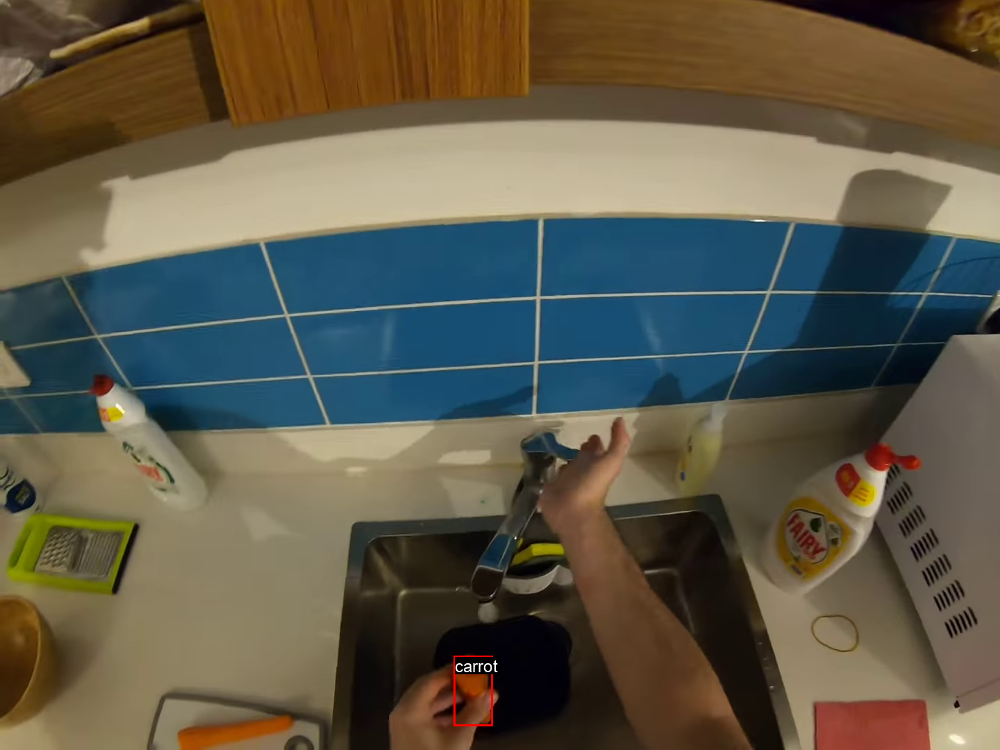

--------------------------------------------------
Frame: pnr_frame
Method: /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json
Used Narrations (if any): []


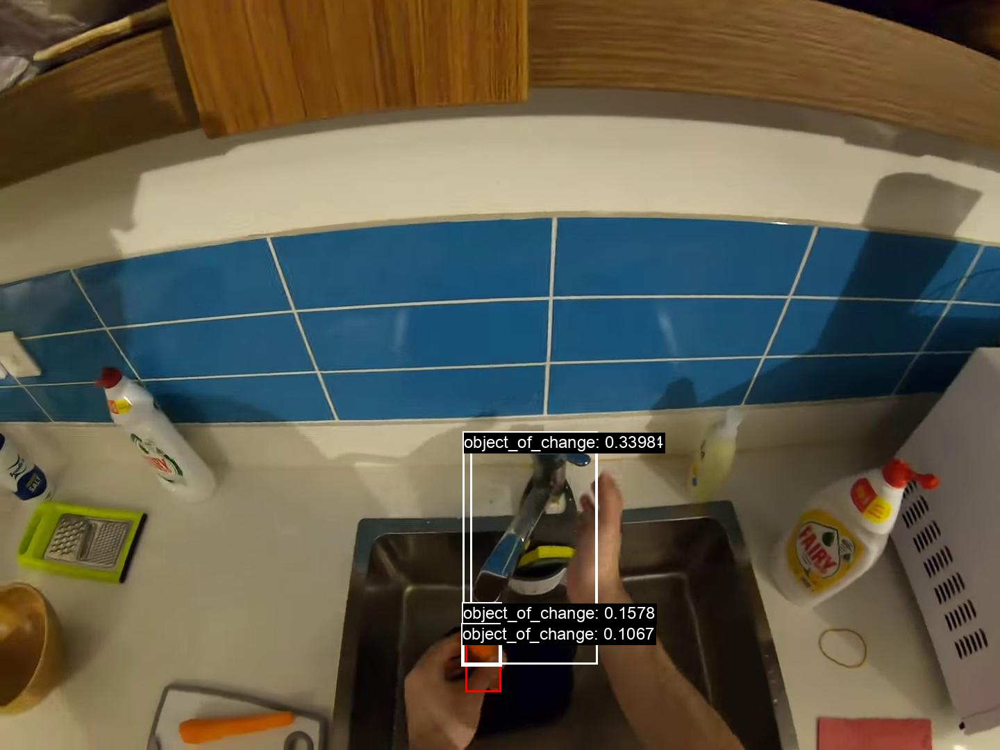

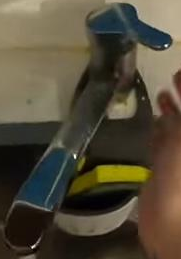

Score: 0.5953848361968994  AP50 = 0.0  AP75 = 0.0
['a close - up of someone cleaning with a vacuum cleaner',
 'baby feet sticking their foot in a sink faucet',
 'the feet of a person with blue, yellow and white shoes']


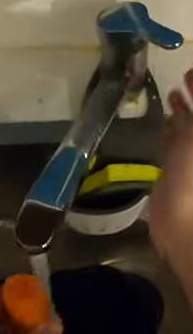

Score: 0.3397870361804962  AP50 = 0.0  AP75 = 0.0
['a person holding an orange carrot while putting them into a sink',
 'a woman using a plunger to beat the carrots',
 'someone is holding a bottle opener with a carrot inside']


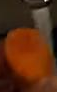

Score: 0.15784905850887299  AP50 = 0.0  AP75 = 0.0
['oranges piled on top of each other in a kitchen',
 'blurry photograph of a donut with one bite taken',
 'blurry image of oranges next to a microwave oven']


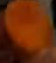

Score: 0.10674295574426651  AP50 = 1.0  AP75 = 0.0
['a brown pitcher on table next to black object',
 'a close up of an orange on a table',
 'an orange is sitting in the middle of a blurry image']
--------------------------------------------------
Frame: post_frame


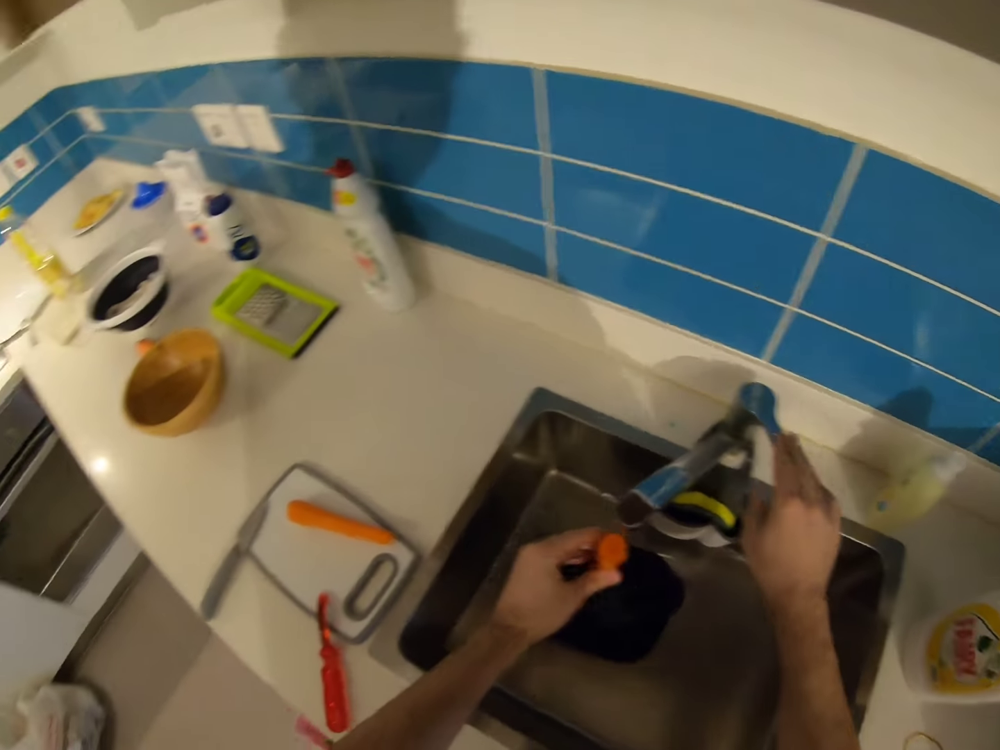

--------------------------------------------------


In [20]:
# To visualize one randomly sampled results, we can define certain criteria (can be none).
# individual precision score for AP50 is either 1 or 0 for each data point.
# So precision > 0 means correct, while <= 0 means wrong, for AP50 results.
# TODO(telinwu): when AP is incorporated, make the criteria more sophisticated.

# Current criteria is both result 3 and 4 should be wrong.
# TODO: can change the below criteria function.
AP_KEY = "AP50" # From ["AP", "AP50", "AP75"], standard object detection average precision metrics.
BEST_AP_KEY = "Best-{}-{}".format(best_k, AP_KEY)
criteria = {
    output_results_json_file_3: lambda x: (x["pnr_frame"][AP_KEY]["precision"] <= 0 and
                                           True),
    output_results_json_file_4: lambda x: (x["pnr_frame"][AP_KEY]["precision"] <= 0 and
                                           x["pnr_frame"][BEST_AP_KEY]["precision"] > 0),
}
# criteria = None
keys_to_sample_from = keys

if criteria is not None:
    for file_name in criteria:
        fulfill_keys = []
        file_res = all_keyed_results[file_name]
        for data_key, data_res in file_res.items():
            if criteria[file_name](data_res):
                fulfill_keys.append(data_key)
        keys_to_sample_from = set(keys_to_sample_from).intersection(set(fulfill_keys))
    keys_to_sample_from = sorted(list(keys_to_sample_from))

print("Valid results fulfilling the criteria: {}".format(len(keys_to_sample_from)))
print()

# Randomly sample a key.
rand_key = np.random.choice(keys_to_sample_from)
print("{}: {}".format(bold_text("Sampled Key:"), rand_key))

# TODO: decide which inference file results should be shown.
named_result_tuple_list = [
    # (output_results_json_file_1, output_results["output_results_1"][rand_key]),
    # (output_results_json_file_2, output_results["output_results_2"][rand_key]),
#     (output_results_json_file_3, output_results["output_results_3"][rand_key]),
    (output_results_json_file_4, output_results["output_results_4"][rand_key]),
]

# Gets the narration for reference.
clip_narrations, closest_narrations = get_scod_clipped_narrations(
    keyed_scod_clips[rand_key],
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=True,
)

# Show the results.
# `frame_keys` here define which frames to be shown.
# If the prediction results do not contain certain specified frames, the images
# will just show the GT bbox (in red).
# TODO: can change `bbox_width`, `label_font_size`, and `resize_image_width`,
# where the `resize_image_width` resizes image widht and height will follow the aspect ratio.

region_proposal_probings = {
    "caption_func": model,
}
# region_proposal_probings = None

visualize_glip_results_comparisons(
    named_result_tuple_list,
    #top_k_bboxes=top_k,
    top_k_bboxes=4,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    # frame_keys=["pre", "pnr"],
#     frame_keys=["pnr"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings=region_proposal_probings,
)

In [18]:
# Interested keys:
# 5f7e3f1e-f4db-461e-8344-c8f130985635_68630
# f6277269-1c87-439c-b5be-d4a02343018a_16740

# Most likely does not know what a jug is:
# c864505c-9d49-4da4-bf7e-254b4c348c03_48705

# DETR recognizes the wrong object for jug:
# c864505c-9d49-4da4-bf7e-254b4c348c03_47437

# GLIP does better:
# eaa817af-b7e0-4f0a-8156-73834cf1157b_27506

# Attributes of a pack?
# c8f8ebf1-5613-4f4a-802c-ada5e4c4b651_4225

# I feel the answer is ok, `cloth` should change state too.
# 8e23dc43-7025-4548-a2bd-0f7d85631602_10361

# GT is off
# 59815805-de31-4993-8f5e-f12b1537bcfc_60560

# `meals`
# 65c16752-c157-4a21-9654-d980f8fdf36c_9362

# detectors strong on hands
# 2d29b45a-169b-453f-8050-98ec147b0ccf_13605

# wrong cupboard
# c2a3d4ac-8d13-4daa-a9a9-a867999e956f_33554

# May need motion and better grounding
# 826e419a-8788-484f-9543-550964666762_60078

# Better inference may solve:
# 17324963-0877-482d-a189-11cc2862095c_39045

# To me, this is good:
# 5d8ebbea-6371-4be5-b611-751fb49ec294_18515

# Better inference may solve:
# c396d137-e956-4a7f-ab2e-5a0b29c51afa_9125

# Better inference may solve:
# 51224e32-3d6c-4148-9eea-7b73da751f25_8416

# ...

# Examples

# Passive/Active Mistakes

--------------------------------------------------
Frame: pre_frame


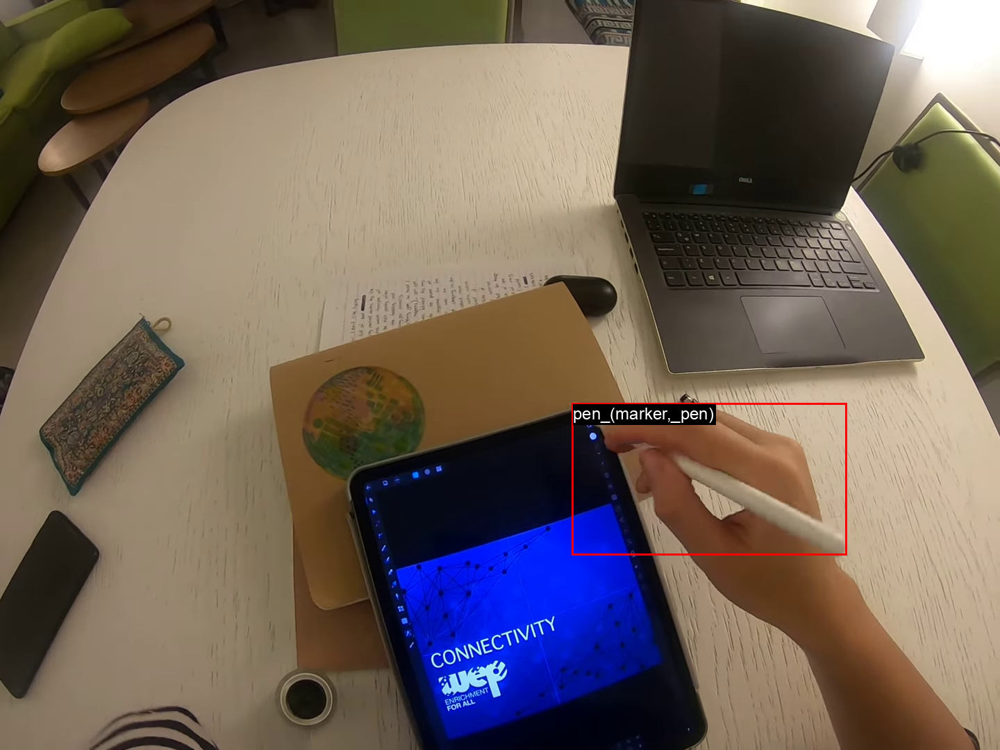

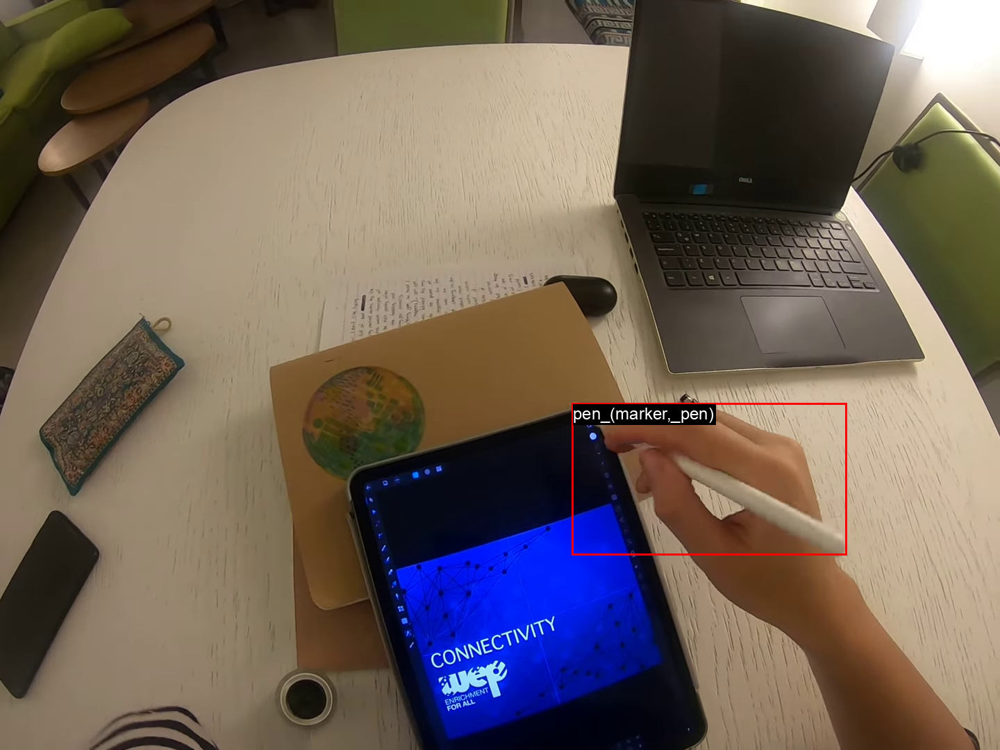

--------------------------------------------------
Frame: pnr_frame
Method: /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json
Used Narrations (if any): []


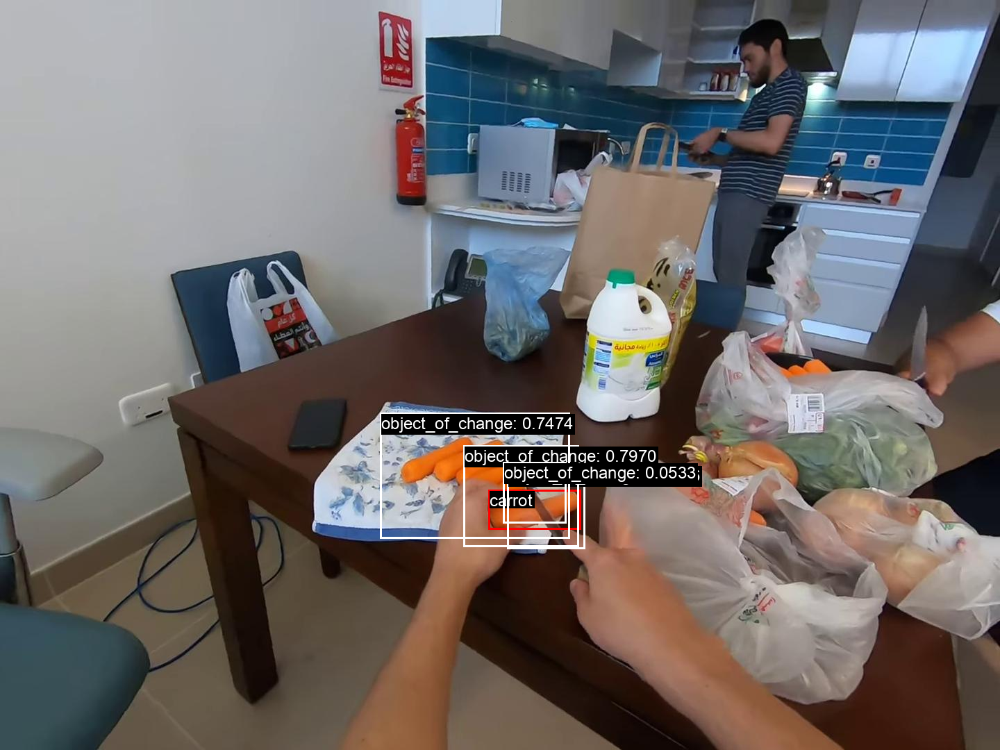

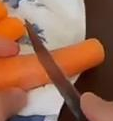

Score: 0.8775689005851746  AP50 = 0.0  AP75 = 0.0
['a child holding an orange carrot with his arms in the air',
 'a woman is cutting up carrots with a large knife',
 'someone is cutting carrots with a pair of scissors']


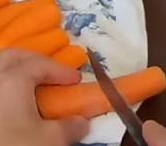

Score: 0.7970269918441772  AP50 = 0.0  AP75 = 0.0
['a hand cutting carrots with a pair of scissors',
 'a person is holding a carrot cut in half',
 'a person holding several carrots, one being cut']


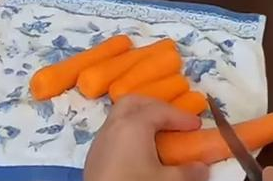

Score: 0.7474085092544556  AP50 = 0.0  AP75 = 0.0
['the person is cutting up carrots with a knife',
 'there are carrots being cut on the cutting board',
 'a person holding a pair of scissors cutting carrots']


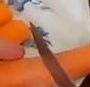

Score: 0.053295549005270004  AP50 = 0.0  AP75 = 0.0
['there are carrots that have been cut up',
 'the carrots are chopped up and stuffed into the shape of bears',
 "a pair of scissors cutting something with it's blade"]
Method: /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json
Used Narrations (if any): []


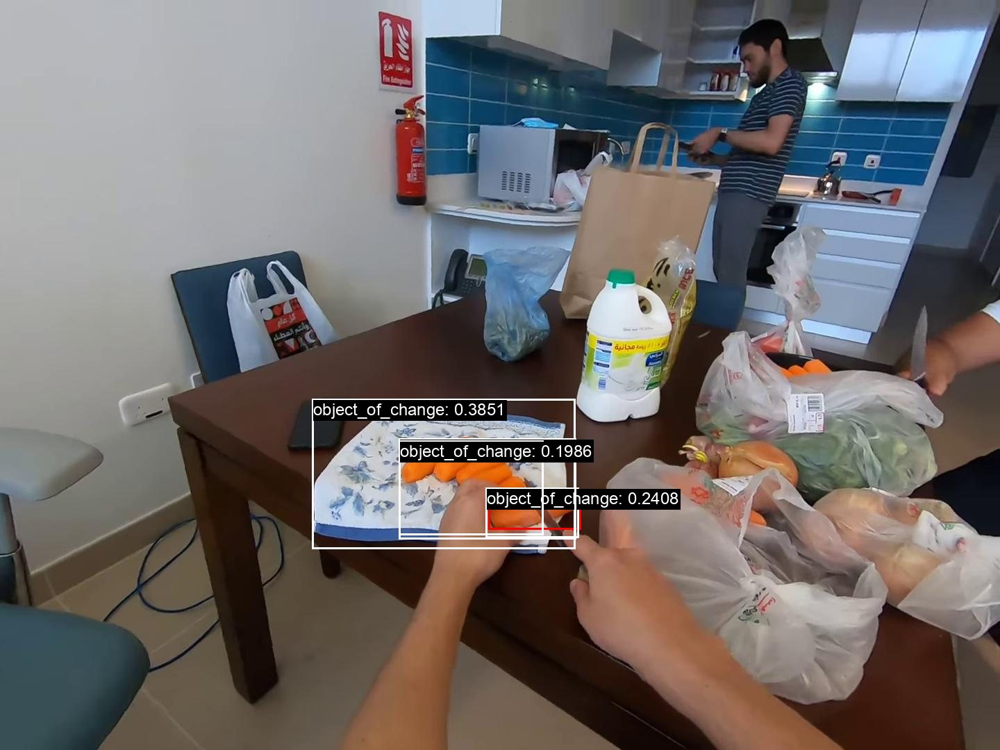

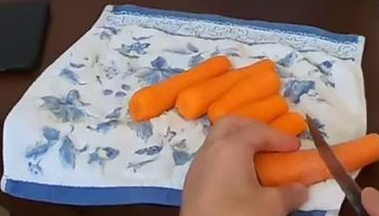

Score: 0.38510575890541077  AP50 = 0.0  AP75 = 0.0
['a person cutting carrots into small strips on top of a blue towel',
 'a person cutting carrots with a pair of scissors',
 'a person cutting carrots with a pair of scissors']


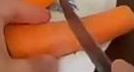

Score: 0.24078266322612762  AP50 = 1.0  AP75 = 1.0
['someone cutting some carrots with a pair of scissors',
 'a person holding a pair of orange peels in their hand',
 'this is the end of a pair of scissors cutting an orange']


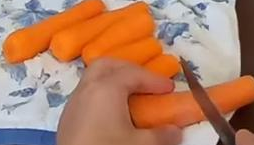

Score: 0.21886000037193298  AP50 = 0.0  AP75 = 0.0
['a person is cutting carrots with a large knife',
 'a close up of person cutting carrots on a paper towel',
 'someone cuts up carrots on a cutting board']


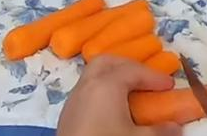

Score: 0.19857844710350037  AP50 = 0.0  AP75 = 0.0
['a person cutting a carrot with a pair of scissors',
 'the person is holding up several carrots while preparing to cut them',
 'the person is peeling carrots on a cutting board']
--------------------------------------------------
Frame: post_frame


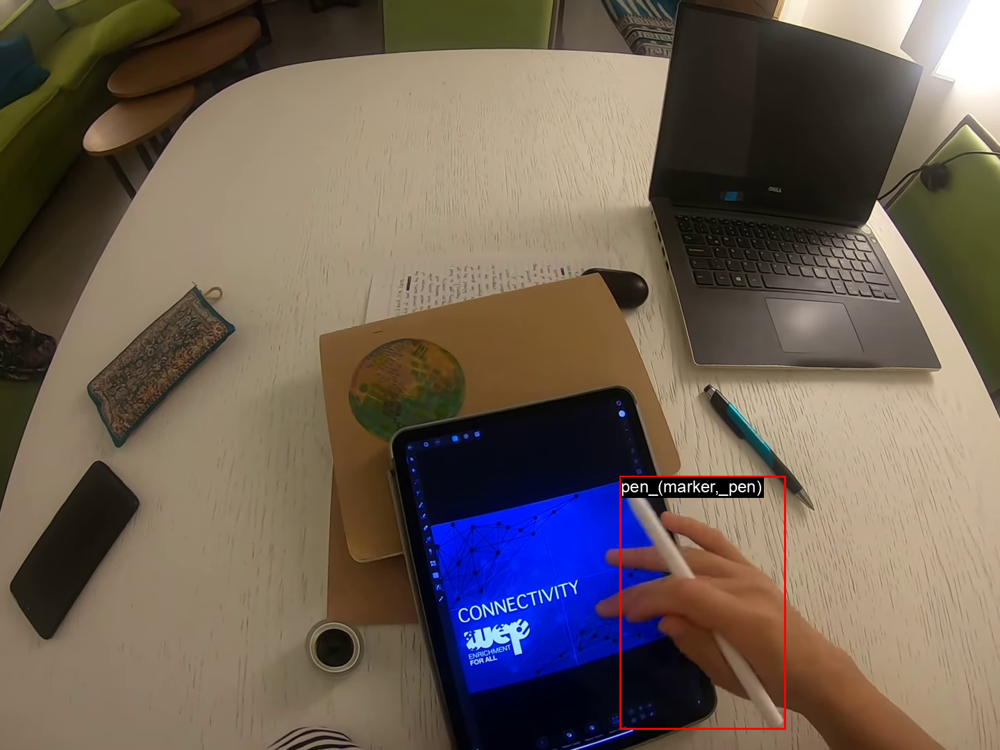

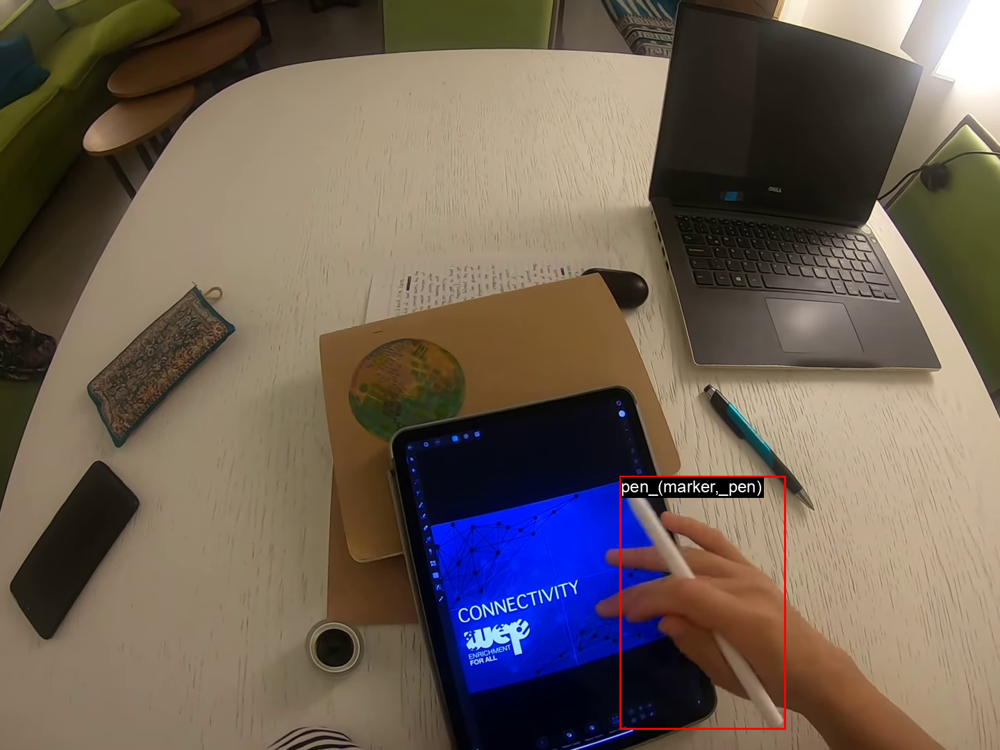

--------------------------------------------------


In [19]:
rand_key = "17324963-0877-482d-a189-11cc2862095c_39045"

visualize_glip_results_comparisons(
    named_result_tuple_list,
    #top_k_bboxes=top_k,
    top_k_bboxes=4,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings=region_proposal_probings,
)

In [ ]:
rand_key = ""

visualize_glip_results_comparisons(
    named_result_tuple_list,
    top_k_bboxes=4,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings=region_proposal_probings,
)

In [ ]:
rand_key = ""

visualize_glip_results_comparisons(
    named_result_tuple_list,
    top_k_bboxes=4,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings=region_proposal_probings,
)

# Part / Whole Mistakes

In [ ]:
visualize_glip_results_comparisons(
    named_result_tuple_list,
    top_k_bboxes=4,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings=region_proposal_probings,
)

In [ ]:
visualize_glip_results_comparisons(
    named_result_tuple_list,
    top_k_bboxes=4,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings=region_proposal_probings,
)

In [ ]:
visualize_glip_results_comparisons(
    named_result_tuple_list,
    top_k_bboxes=4,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
    region_proposal_probings=region_proposal_probings,
)

# END